In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

!ln -s /content/gdrive/My\ Drive/ /mydrive

Mounted at /content/gdrive


# Step 1: Install Requirements

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 9886, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 9886 (delta 3), reused 3 (delta 1), pack-reused 9876
Receiving objects: 100% (9886/9886), 10.05 MiB | 14.88 MiB/s, done.
Resolving deltas: 100% (6876/6876), done.
/content/yolov5
     |████████████████████████████████| 596 kB 13.0 MB/s 
Setup complete. Using torch 1.9.0+cu111 (Tesla K80)


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/gdrive/MyDrive/license_plate/yolov5_lp_data/"

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 1280 --batch 8 --epochs 100 --data /content/gdrive/MyDrive/license_plate/yolov5_lp_data/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/gdrive/MyDrive/license_plate/yolov5_lp_data/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=8, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-25-g15e8c4c torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, h

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1272), started 0:02:41 ago. (Use '!kill 1272' to kill it.)

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 1280 --conf 0.1 --source /content/gdrive/MyDrive/license_plate/yolov5_lp_data/val/images


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/license_plate/yolov5_lp_data/val/images, imgsz=[1280, 1280], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-25-g15e8c4c torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/gdrive/MyDrive/license_plate/yolov5_lp_data/val/images/2019_00001 04.jpg: 736x1280 1 license-plate, Done. (0.065s)
image 2/20 /content/gdrive/MyDrive/license_plate/yolov5_lp_data/val/images/2019_00002 05.jpg: 736x1280 1 license-plate, Done. (0.057s)
image 3/20 /content/gdrive/MyDrive/license_plate/yolov5_lp_data/val/images/2019_

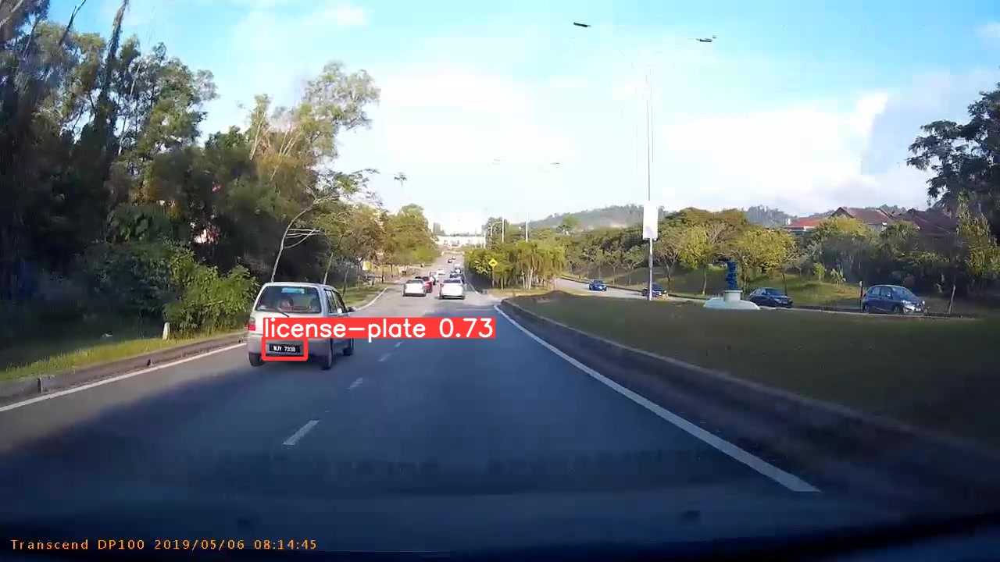

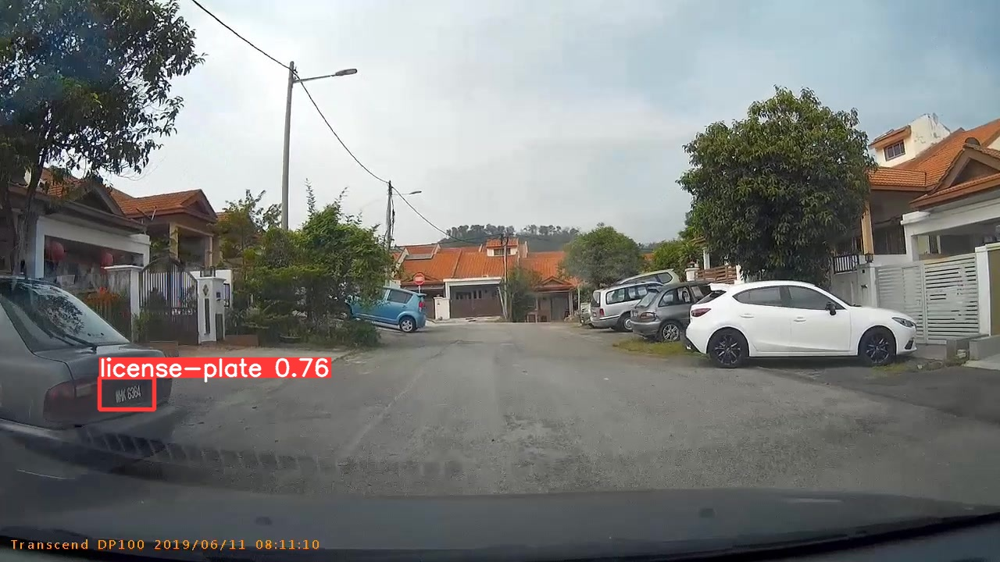

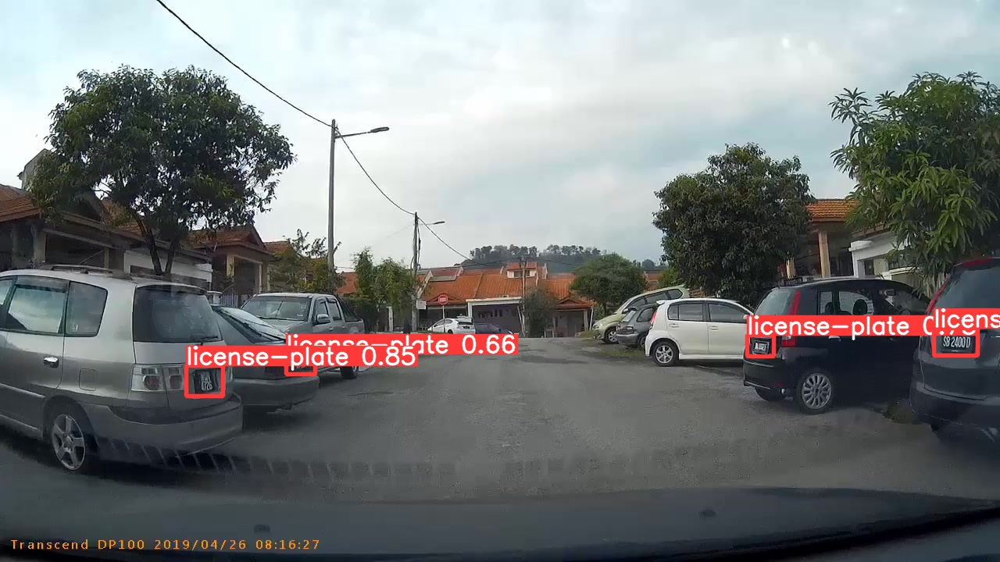

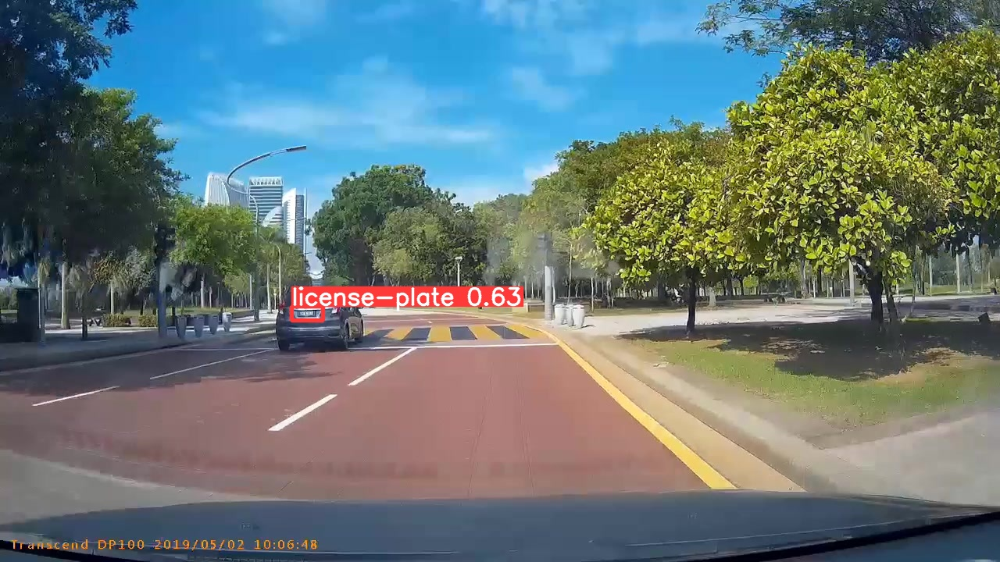

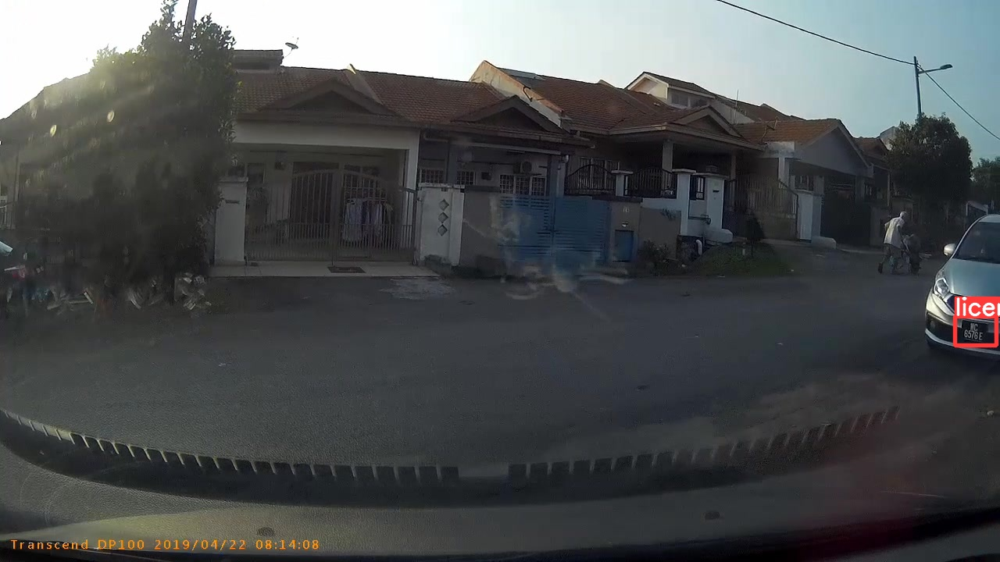

...

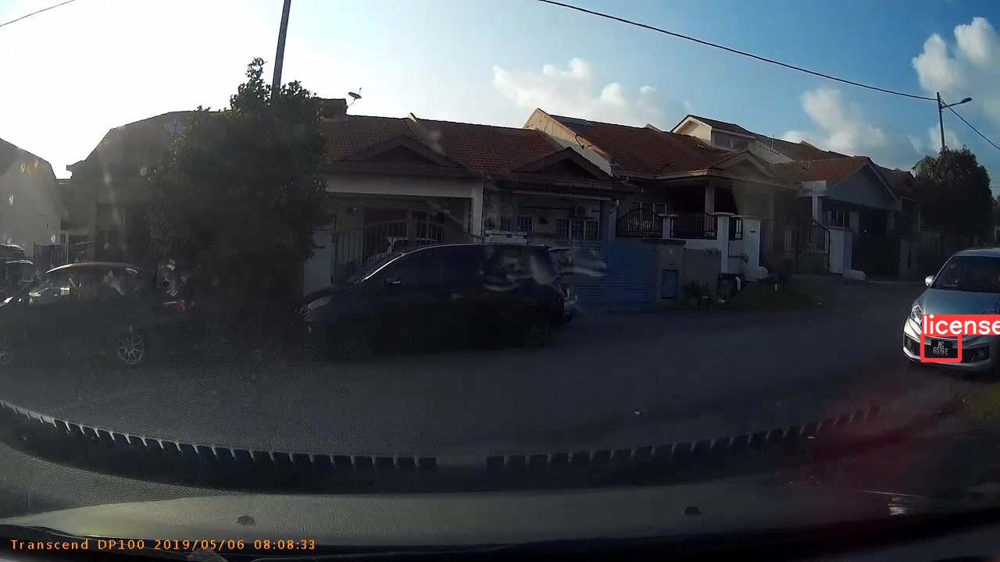

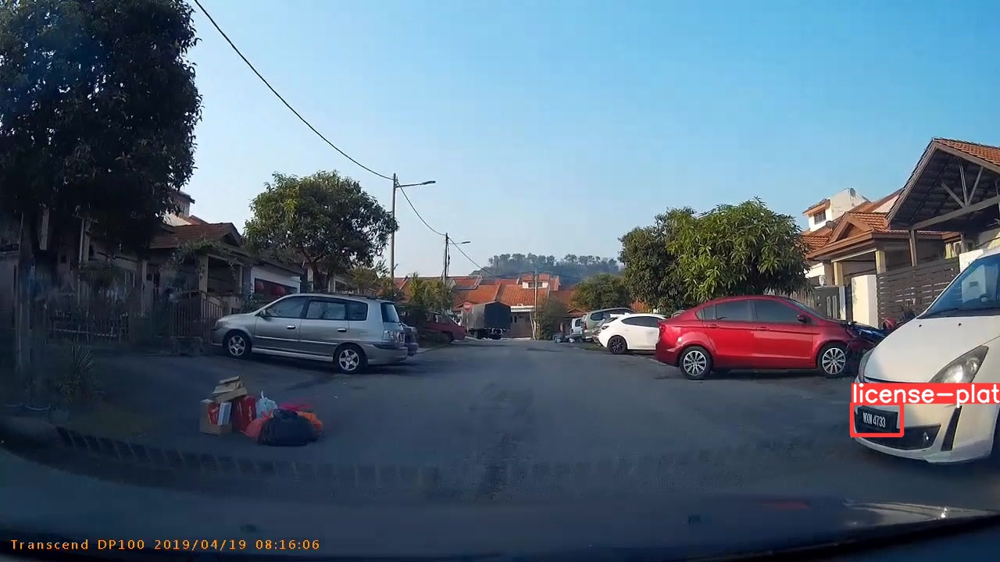

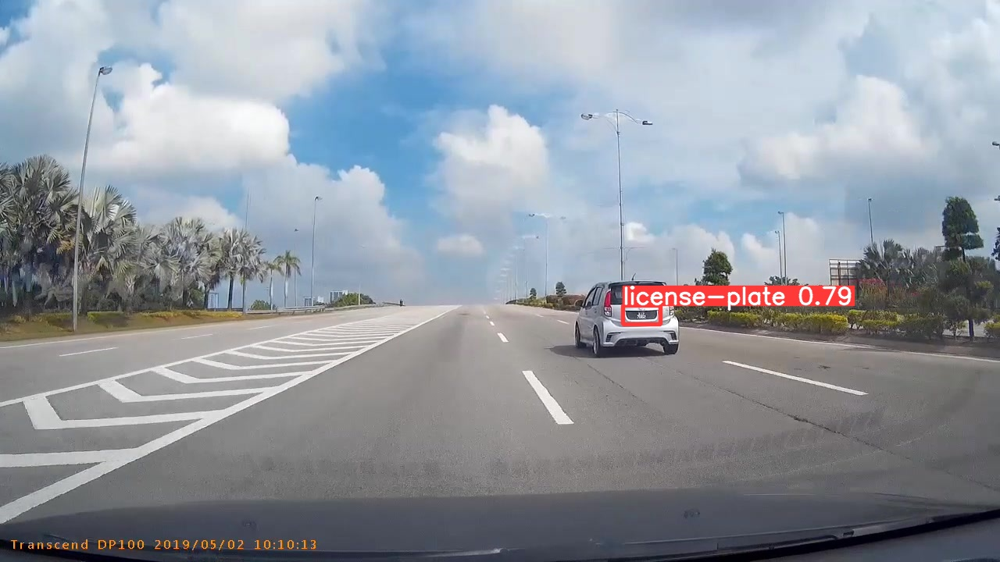

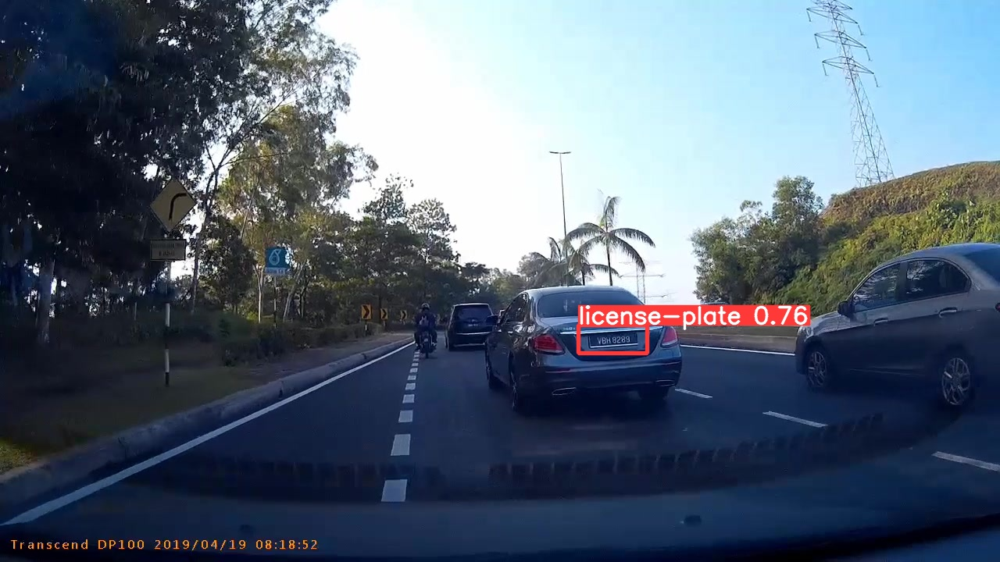

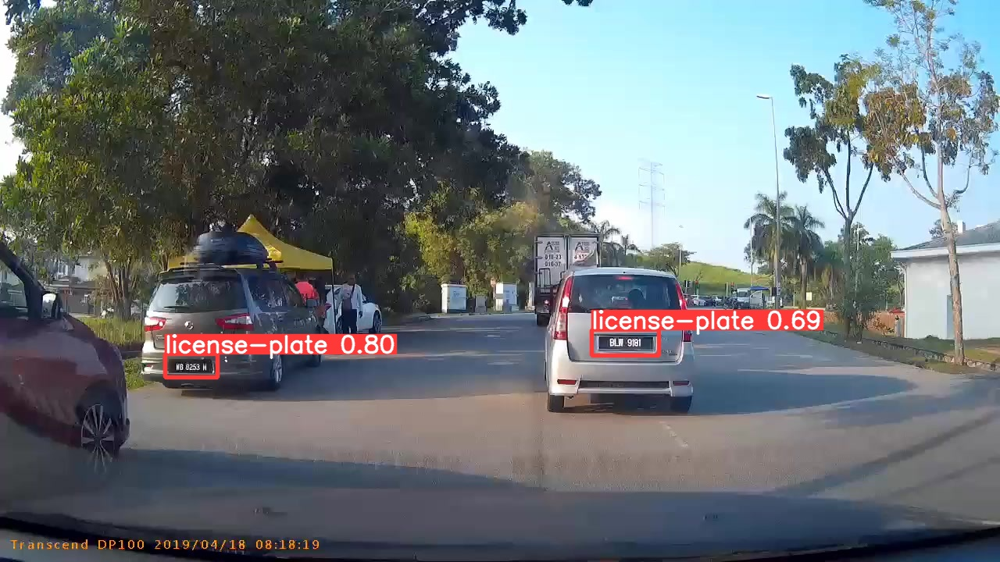

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Inference

`detect.py` runs YOLOv5 inference on a variety of sources, downloading models automatically from the [latest YOLOv5 release](https://github.com/ultralytics/yolov5/releases), and saving results to `runs/detect`. Example inference sources are:

```shell
python detect.py --source 0  # webcam
                          file.jpg  # image 
                          file.mp4  # video
                          path/  # directory
                          path/*.jpg  # glob
                          'https://youtu.be/NUsoVlDFqZg'  # YouTube
                          'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP stream
```

In [ ]:
!python detect.py --weights /content/gdrive/MyDrive/license_plate/best.pt --img 1280 --conf 0.25 --source /content/gdrive/MyDrive/license_plate/2019_00031.mp4

Streaming output truncated to the last 5000 lines.
video 1/1 (403/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (404/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (405/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (406/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (407/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (408/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (409/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (410/5400) /content/gdrive/MyDrive/license_plate/2019_00031.mp4: 736x1280 1 license-plate, Done. (0.043s)
video 1/1 (411/5400) 

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>